In [ ]:
import numpy as np

In [ ]:
import pandas as pd

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
from DataTransformation import LowPassFilter

In [ ]:
from scipy.signal import argrelextrema

In [ ]:
from sklearn.metrics import mean_absolute_error

In [ ]:
pd.options.mode.chained_assignment = None

In [ ]:
plt.style.use("fivethirtyeight")
plt.rcParams["figure.figsize"] = (20, 5)
plt.rcParams["figure.dpi"] = 100
plt.rcParams["lines.linewidth"] = 2

In [ ]:
df = pd.read_pickle("../../data/interim/01_data_processed.pkl")

In [ ]:
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90


In [ ]:
df = df[df["label"] != "rest"]

In [ ]:
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90


In [ ]:
acc_r = df["acc_x"] ** 2 + df["acc_y"] ** 2 + df["acc_z"] ** 2

In [ ]:
gyr_r = df["gyr_x"] ** 2 + df["gyr_y"] ** 2 + df["gyr_z"] ** 2

In [ ]:
df["acc_r"] = np.sqrt(acc_r)

In [ ]:
df["gyr_r"] = np.sqrt(gyr_r)

In [ ]:
acc_r

epoch (ms)
2019-01-11 15:08:05.200    0.959752
2019-01-11 15:08:05.400    0.948193
2019-01-11 15:08:05.600    0.948277
2019-01-11 15:08:05.800    0.921827
2019-01-11 15:08:06.000    0.931134
                             ...   
2019-01-20 17:33:27.000    1.092879
2019-01-20 17:33:27.200    1.065800
2019-01-20 17:33:27.400    1.073285
2019-01-20 17:33:27.600    1.055482
2019-01-20 17:33:27.800    1.074573
Length: 7899, dtype: float64

In [ ]:
gyr_r

epoch (ms)
2019-01-11 15:08:05.200    10.404654
2019-01-11 15:08:05.400     8.336328
2019-01-11 15:08:05.600     8.624326
2019-01-11 15:08:05.800    89.747245
2019-01-11 15:08:06.000    21.377539
                             ...    
2019-01-20 17:33:27.000    33.691343
2019-01-20 17:33:27.200    13.042268
2019-01-20 17:33:27.400    34.449584
2019-01-20 17:33:27.600     1.378254
2019-01-20 17:33:27.800    18.350756
Length: 7899, dtype: float64

In [ ]:
df["acc_r"]

epoch (ms)
2019-01-11 15:08:05.200    0.979669
2019-01-11 15:08:05.400    0.973752
2019-01-11 15:08:05.600    0.973795
2019-01-11 15:08:05.800    0.960118
2019-01-11 15:08:06.000    0.964953
                             ...   
2019-01-20 17:33:27.000    1.045408
2019-01-20 17:33:27.200    1.032376
2019-01-20 17:33:27.400    1.035995
2019-01-20 17:33:27.600    1.027367
2019-01-20 17:33:27.800    1.036616
Name: acc_r, Length: 7899, dtype: float64

In [ ]:
df["gyr_r"]

epoch (ms)
2019-01-11 15:08:05.200    3.225625
2019-01-11 15:08:05.400    2.887270
2019-01-11 15:08:05.600    2.936720
2019-01-11 15:08:05.800    9.473502
2019-01-11 15:08:06.000    4.623585
                             ...   
2019-01-20 17:33:27.000    5.804424
2019-01-20 17:33:27.200    3.611408
2019-01-20 17:33:27.400    5.869377
2019-01-20 17:33:27.600    1.173990
2019-01-20 17:33:27.800    4.283778
Name: gyr_r, Length: 7899, dtype: float64

In [ ]:
bench_df = df[df["label"] == "bench"]

In [ ]:
squat_df = df[df["label"] == "squat"]

In [ ]:
row_df = df[df["label"] == "row"]

In [ ]:
ohp_df = df[df["label"] == "ohp"]

In [ ]:
dead_df = df[df["label"] == "dead"]

In [ ]:
bench_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.890400,2.439200,0.9388,B,bench,heavy,30,0.979669,3.225625
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.682600,-0.890400,2.1708,B,bench,heavy,30,0.973752,2.887270
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.560800,-0.256000,-1.4146,B,bench,heavy,30,0.973795,2.936720
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.061000,-4.524400,-2.0730,B,bench,heavy,30,0.960118,9.473502
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.439000,-1.548600,-3.6098,B,bench,heavy,30,0.964953,4.623585
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-19 17:24:41.800,0.013000,1.026667,-0.096333,-1.268400,2.841600,2.0610,E,bench,medium,71,1.031258,3.732459
2019-01-19 17:24:42.000,0.017500,0.955000,-0.075000,0.451200,0.024400,0.5242,E,bench,medium,71,0.958100,0.692071
2019-01-19 17:24:42.200,0.023667,0.964000,-0.086333,1.475600,-0.024200,1.5974,E,bench,medium,71,0.968147,2.174780


In [ ]:
squat_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 16:05:44.600,0.135333,0.694667,0.735333,2.5366,-0.6220,1.6098,A,squat,medium,27,1.020584,3.068009
2019-01-11 16:05:44.800,0.097500,0.651500,0.658000,2.0854,0.0366,0.1952,A,squat,medium,27,0.931087,2.094835
2019-01-11 16:05:45.000,0.148667,0.719667,0.694333,-0.0364,1.2562,0.0242,A,squat,medium,27,1.011000,1.256960
2019-01-11 16:05:45.200,0.138000,0.692000,0.632000,5.9878,-4.5734,1.0976,A,squat,medium,27,0.947276,7.614096
2019-01-11 16:05:45.400,0.131667,0.716000,0.658000,-4.1586,-2.9636,-0.5852,A,squat,medium,27,0.981303,5.139975
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-18 17:04:06.800,0.123000,0.802333,0.541333,3.9510,-1.1220,0.4634,D,squat,heavy,62,0.975659,4.133283
2019-01-18 17:04:07.000,0.118500,0.812500,0.535000,-3.4390,-0.8536,0.6222,D,squat,heavy,62,0.980012,3.597567
2019-01-18 17:04:07.200,0.116000,0.801000,0.543333,-1.3172,-0.7806,1.4754,D,squat,heavy,62,0.974817,2.126301


In [ ]:
row_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-14 14:01:40.000,-0.037000,-0.854000,0.271000,-31.8172,-1.6830,-6.3660,C,row,medium,51,0.896731,32.491424
2019-01-14 14:01:40.200,-0.042500,-0.884000,0.174000,-56.3416,-8.3172,-9.9388,C,row,medium,51,0.901964,57.812900
2019-01-14 14:01:40.400,-0.008333,-0.967667,0.030333,-31.4388,-3.0732,0.9266,C,row,medium,51,0.968178,31.602236
2019-01-14 14:01:40.600,-0.018500,-1.046500,-0.042500,-4.5244,-4.9632,1.3536,C,row,medium,51,1.047526,6.850969
2019-01-14 14:01:40.800,-0.031000,-1.098667,-0.062333,7.7318,1.9634,4.4878,C,row,medium,51,1.100870,9.152924
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90,1.045408,5.804424
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90,1.032376,3.611408
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90,1.035995,5.869377


In [ ]:
ohp_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 15:38:55.000,-0.062500,0.901000,0.047000,0.4390,-6.5000,-0.0854,A,ohp,heavy,9,0.904387,6.515368
2019-01-11 15:38:55.200,-0.080667,1.080667,0.060333,5.5976,-3.2196,-1.4266,A,ohp,heavy,9,1.085351,6.613179
2019-01-11 15:38:55.400,-0.137500,1.314000,0.024000,20.8534,7.7562,-44.1340,A,ohp,heavy,9,1.321393,49.425023
2019-01-11 15:38:55.600,-0.234667,0.910333,-0.007000,17.7684,11.4880,-35.0002,A,ohp,heavy,9,0.940119,40.898706
2019-01-11 15:38:55.800,-0.337000,0.861000,-0.095500,2.3778,2.2682,-4.6220,A,ohp,heavy,9,0.929522,5.671115
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-15 13:55:56.600,-0.218667,1.206667,-0.129333,-32.1462,-11.7194,35.2438,E,ohp,heavy,78,1.233121,49.120749
2019-01-15 13:55:56.800,-0.095500,1.135500,-0.097000,27.0488,-2.8536,-0.0976,E,ohp,heavy,78,1.143630,27.199083
2019-01-15 13:55:57.000,-0.122667,0.944000,-0.114000,-15.6584,-3.2318,-4.2560,E,ohp,heavy,78,0.958738,16.545197


In [ ]:
dead_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 16:24:24.800,0.056500,-1.027000,-0.165500,3.231667,-2.6830,2.418667,A,dead,medium,6,1.041783,4.846866
2019-01-11 16:24:25.000,0.073333,-1.025000,-0.155333,12.853600,-30.9024,4.487800,A,dead,medium,6,1.039294,33.768531
2019-01-11 16:24:25.200,0.059000,-1.022000,-0.125500,2.073200,-1.2316,3.170800,A,dead,medium,6,1.031366,3.983588
2019-01-11 16:24:25.400,0.030667,-1.031667,-0.114667,-0.329600,3.1098,1.817000,A,dead,medium,6,1.038472,3.616764
2019-01-11 16:24:25.600,0.046500,-1.025500,-0.124500,-0.975600,9.7682,-2.219400,A,dead,medium,6,1.034076,10.064555
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-16 19:35:42.800,0.015000,-1.083000,-0.164500,-0.341600,-6.3658,2.390200,E,dead,heavy,72,1.095525,6.808315
2019-01-16 19:35:43.000,-0.007000,-1.308000,-0.209333,4.939000,31.2440,-21.219400,E,dead,heavy,72,1.324664,38.089949
2019-01-16 19:35:43.200,0.161500,-1.003000,-0.113500,-4.427000,7.7680,12.585400,E,dead,heavy,72,1.022239,15.438020


In [ ]:
plot_df = bench_df

<Axes: xlabel='epoch (ms)'>

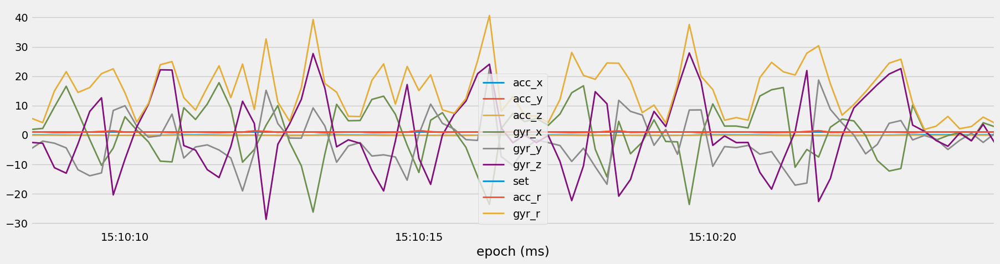

In [ ]:
plot_df[plot_df["set"] == plot_df["set"].unique()[1]].plot()

In [ ]:
plot_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.890400,2.439200,0.9388,B,bench,heavy,30,0.979669,3.225625
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.682600,-0.890400,2.1708,B,bench,heavy,30,0.973752,2.887270
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.560800,-0.256000,-1.4146,B,bench,heavy,30,0.973795,2.936720
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.061000,-4.524400,-2.0730,B,bench,heavy,30,0.960118,9.473502
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.439000,-1.548600,-3.6098,B,bench,heavy,30,0.964953,4.623585
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-19 17:24:41.800,0.013000,1.026667,-0.096333,-1.268400,2.841600,2.0610,E,bench,medium,71,1.031258,3.732459
2019-01-19 17:24:42.000,0.017500,0.955000,-0.075000,0.451200,0.024400,0.5242,E,bench,medium,71,0.958100,0.692071
2019-01-19 17:24:42.200,0.023667,0.964000,-0.086333,1.475600,-0.024200,1.5974,E,bench,medium,71,0.968147,2.174780


<Axes: xlabel='epoch (ms)'>

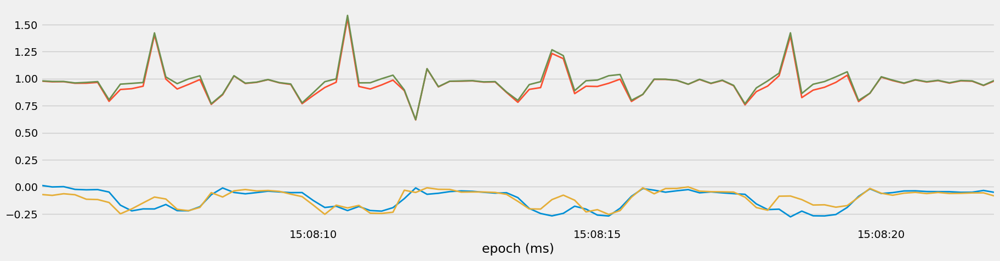

In [ ]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_x"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_y"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_z"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_r"].plot()

<Axes: xlabel='epoch (ms)'>

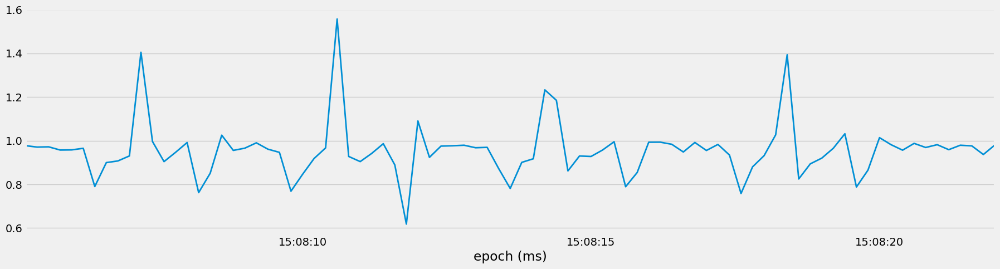

In [ ]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_y"].plot()

<Axes: xlabel='epoch (ms)'>

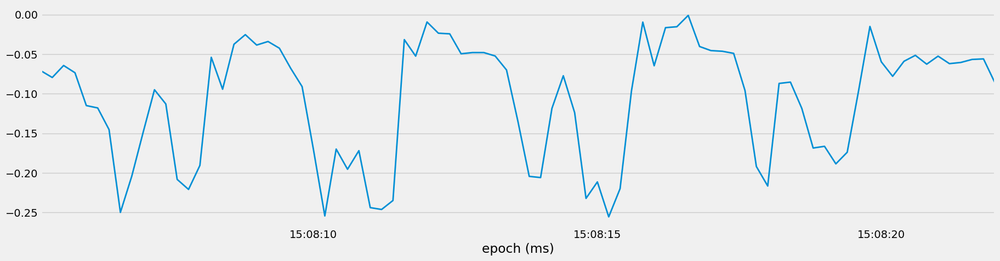

In [ ]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_z"].plot()

<Axes: xlabel='epoch (ms)'>

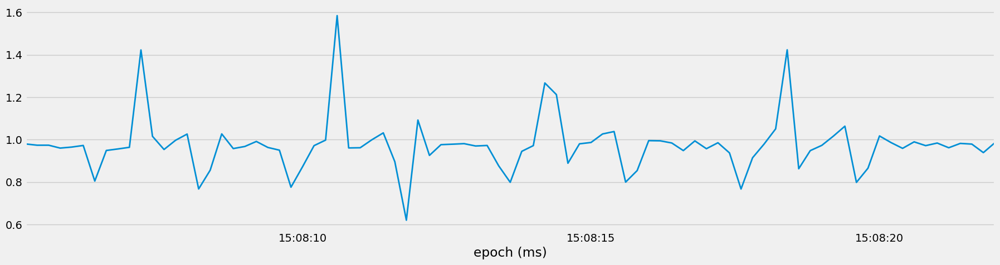

In [ ]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_r"].plot()

<Axes: xlabel='epoch (ms)'>

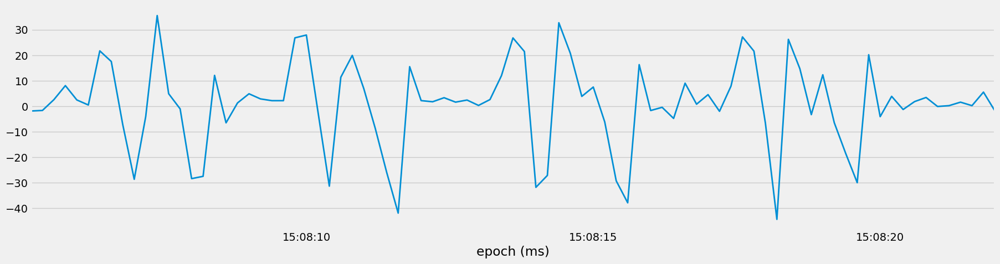

In [ ]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_x"].plot()

<Axes: xlabel='epoch (ms)'>

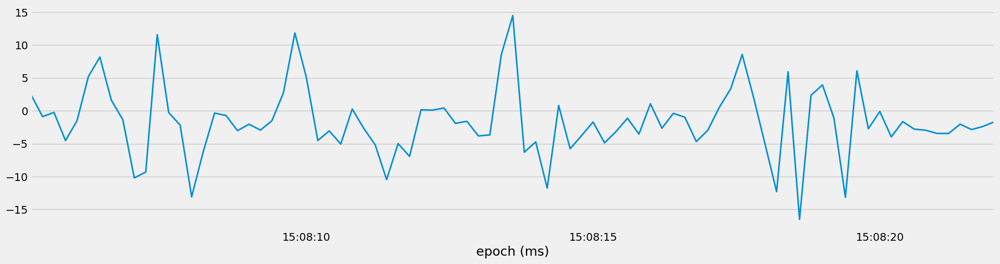

In [ ]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_y"].plot()

<Axes: xlabel='epoch (ms)'>

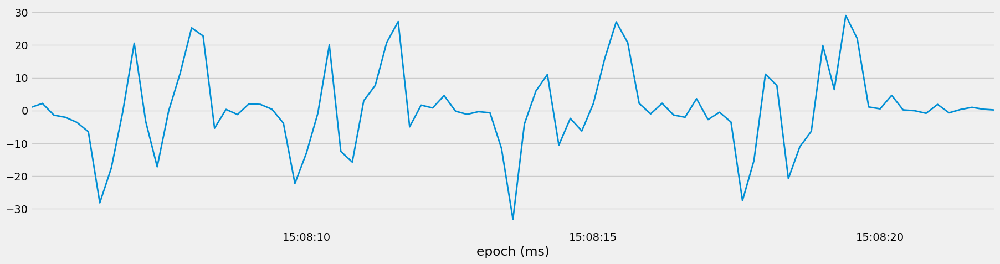

In [ ]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_z"].plot()

<Axes: xlabel='epoch (ms)'>

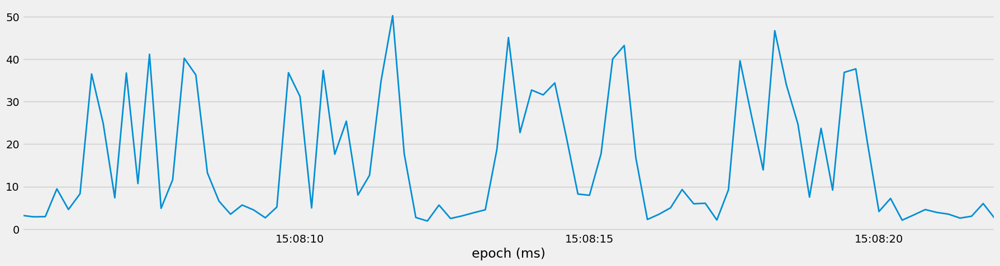

In [ ]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_r"].plot()

In [ ]:
fs = 1000/200

In [ ]:
LowPass = LowPassFilter()

In [ ]:
bench_set = bench_df[bench_df["set"] == bench_df["set"].unique()[0]]

In [ ]:
squat_set = squat_df[squat_df["set"] == squat_df["set"].unique()[0]]

In [ ]:
row_set = row_df[row_df["set"] == row_df["set"].unique()[0]]

In [ ]:
ohp_set = ohp_df[ohp_df["set"] == ohp_df["set"].unique()[0]]

In [ ]:
dead_set = dead_df[dead_df["set"] == dead_df["set"].unique()[0]]

<Axes: xlabel='epoch (ms)'>

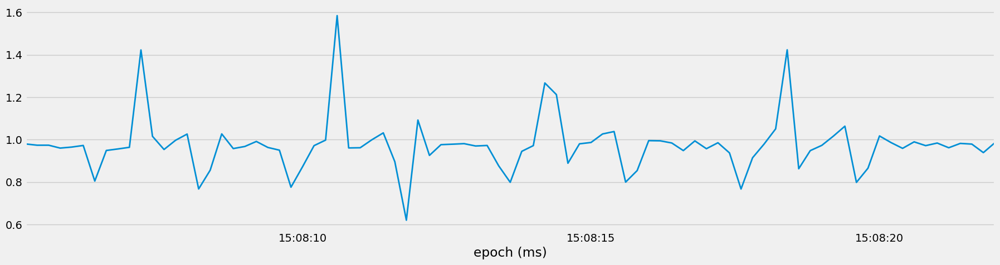

In [ ]:
bench_set["acc_r"].plot()

In [ ]:
column = "acc_r"

In [ ]:
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=5
)

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r,acc_r_lowpass
epoch (ms),,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30,0.979669,3.225625,0.981060
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30,0.973752,2.887270,0.961606
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30,0.973795,2.936720,0.945699
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30,0.960118,9.473502,0.936613
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30,0.964953,4.623585,0.936412
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:08:21.200,-0.045333,0.958667,-0.062000,0.2074,-3.4512,-0.7072,B,bench,heavy,30,0.961738,3.529012,0.980293
2019-01-11 15:08:21.400,-0.051000,0.979000,-0.060500,1.5732,-2.0366,0.3170,B,bench,heavy,30,0.982193,2.592911,0.983985
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,B,bench,heavy,30,0.978938,3.034609,0.986107


<Axes: xlabel='epoch (ms)'>

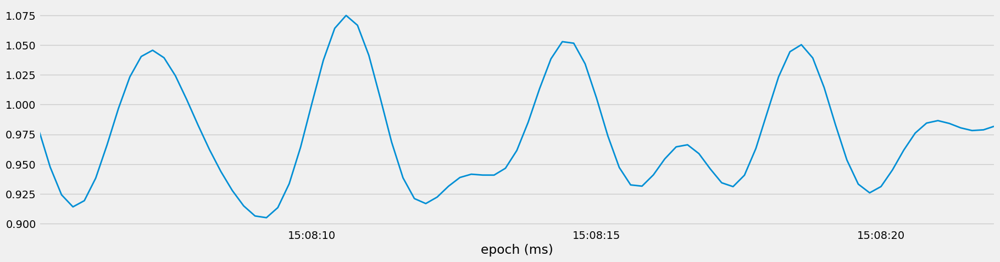

In [ ]:
column = "acc_r"
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.5, order=10
)[column + "_lowpass"].plot()

<Axes: xlabel='epoch (ms)'>

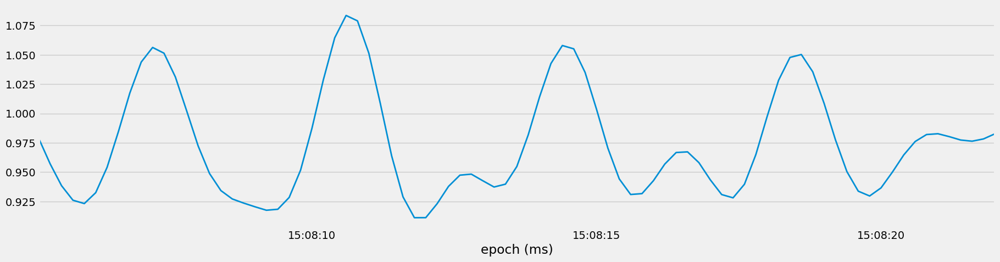

In [ ]:
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.5, order=5
)[column + "_lowpass"].plot()

<Axes: xlabel='epoch (ms)'>

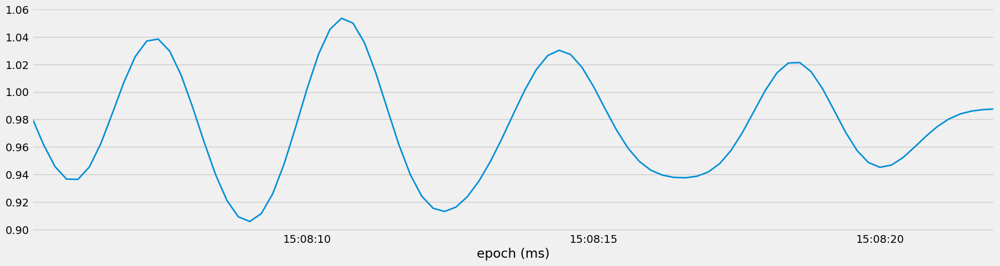

In [ ]:
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=5
)[column + "_lowpass"].plot()

<Axes: xlabel='epoch (ms)'>

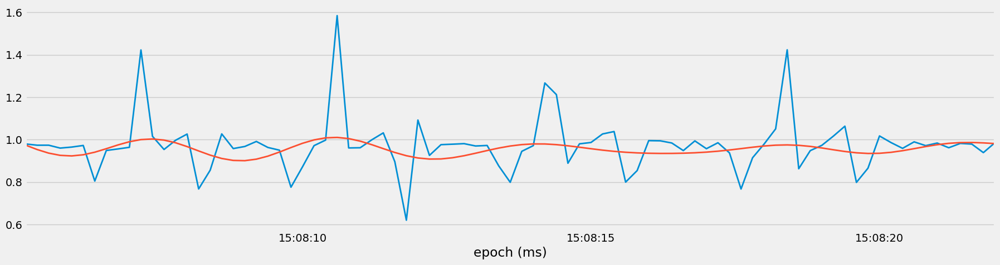

In [ ]:
bench_set["acc_r"].plot()

column = "acc_y"
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)[column + "_lowpass"].plot()

<Axes: xlabel='epoch (ms)'>

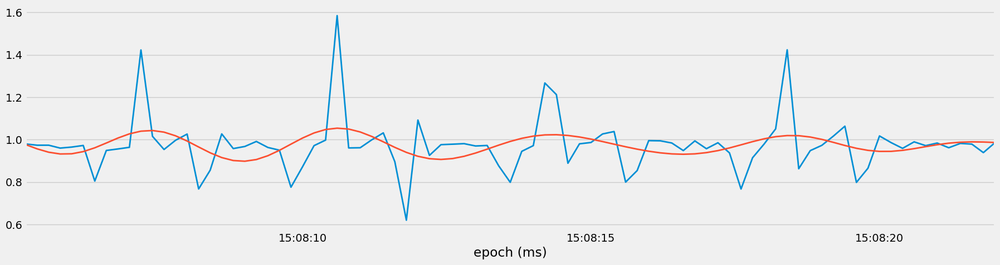

In [ ]:
bench_set["acc_r"].plot()

column = "acc_r"
LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)[column + "_lowpass"].plot()

In [ ]:
bench_set["acc_r"]

epoch (ms)
2019-01-11 15:08:05.200    0.979669
2019-01-11 15:08:05.400    0.973752
2019-01-11 15:08:05.600    0.973795
2019-01-11 15:08:05.800    0.960118
2019-01-11 15:08:06.000    0.964953
                             ...   
2019-01-11 15:08:21.200    0.961738
2019-01-11 15:08:21.400    0.982193
2019-01-11 15:08:21.600    0.978938
2019-01-11 15:08:21.800    0.938789
2019-01-11 15:08:22.000    0.985489
Name: acc_r, Length: 85, dtype: float64

In [ ]:
bench_set["acc_r"].values

array([0.97966946, 0.97375189, 0.97379498, 0.96011835, 0.96495308,
       0.97253535, 0.80472991, 0.94894692, 0.95602383, 0.96380561,
       1.4227222 , 1.01563638, 0.95357881, 0.99698909, 1.0261941 ,
       0.76743876, 0.85595184, 1.02702848, 0.95787711, 0.96774726,
       0.99141806, 0.96311136, 0.95030878, 0.77571612, 0.87183689,
       0.9716823 , 0.99780988, 1.58457226, 0.96087119, 0.96173398,
       0.99902013, 1.03182847, 0.89592689, 0.62031484, 1.09224275,
       0.92574538, 0.97632588, 0.97849195, 0.98106122, 0.97003157,
       0.97251615, 0.87653237, 0.79885098, 0.94483888, 0.97176849,
       1.26706728, 1.21233975, 0.88869483, 0.98022055, 0.98659554,
       1.02670076, 1.03818459, 0.79975587, 0.85421221, 0.99526412,
       0.99439492, 0.98414865, 0.948357  , 0.99404644, 0.9572625 ,
       0.98535098, 0.9374376 , 0.76722451, 0.91454155, 0.97920745,
       1.05077126, 1.42335644, 0.8628253 , 0.94820427, 0.97301208,
       1.01644987, 1.06336694, 0.79847396, 0.86533866, 1.01733

In [ ]:
bench_set

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r,acc_r_lowpass,acc_y_lowpass
epoch (ms),,,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30,0.979669,3.225625,0.976835,0.974240
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30,0.973752,2.887270,0.956580,0.953459
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30,0.973795,2.936720,0.940739,0.936471
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30,0.960118,9.473502,0.932398,0.925893
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30,0.964953,4.623585,0.933303,0.923233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:08:21.200,-0.045333,0.958667,-0.062000,0.2074,-3.4512,-0.7072,B,bench,heavy,30,0.961738,3.529012,0.983332,0.982579
2019-01-11 15:08:21.400,-0.051000,0.979000,-0.060500,1.5732,-2.0366,0.3170,B,bench,heavy,30,0.982193,2.592911,0.987855,0.986070
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,B,bench,heavy,30,0.978938,3.034609,0.989466,0.986568


In [ ]:
column = "acc_r"

In [ ]:
data

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r,acc_r_lowpass,acc_y_lowpass
epoch (ms),,,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30,0.979669,3.225625,0.976835,0.974240
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30,0.973752,2.887270,0.956580,0.953459
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30,0.973795,2.936720,0.940739,0.936471
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30,0.960118,9.473502,0.932398,0.925893
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30,0.964953,4.623585,0.933303,0.923233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:08:21.200,-0.045333,0.958667,-0.062000,0.2074,-3.4512,-0.7072,B,bench,heavy,30,0.961738,3.529012,0.983332,0.982579
2019-01-11 15:08:21.400,-0.051000,0.979000,-0.060500,1.5732,-2.0366,0.3170,B,bench,heavy,30,0.982193,2.592911,0.987855,0.986070
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,B,bench,heavy,30,0.978938,3.034609,0.989466,0.986568


In [ ]:
data[column + "_lowpass"].values

array([0.97683466, 0.95658018, 0.94073948, 0.9323977 , 0.93330291,
       0.94353753, 0.96148318, 0.98408848, 1.00739377, 1.02721988,
       1.03989838, 1.04291371, 1.03534518, 1.01803417, 0.99345168,
       0.96529399, 0.9378796 , 0.91545125, 0.90149918, 0.89821411,
       0.90615433, 0.9241752 , 0.94962653, 0.97878139, 1.00742377,
       1.03149813, 1.04771546, 1.05401921, 1.0498404 , 1.03610919,
       1.01503365, 0.98969686, 0.96355223, 0.93990829, 0.92148733,
       0.9101191 , 0.90659909, 0.91070768, 0.92136075, 0.93684694,
       0.95510389, 0.9739917 , 0.99153345, 1.00610331, 1.01655256,
       1.02226939, 1.0231735 , 1.01965125, 1.01244372, 1.00250743,
       0.99087299, 0.97852837, 0.96634724, 0.95507086, 0.94533496,
       0.9377177 , 0.93277613, 0.9310401 , 0.93294678, 0.93872085,
       0.94822957, 0.96085981, 0.97546853, 0.99044628, 1.00390624,
       1.01397697, 1.01914371, 1.01856267, 1.01227075, 1.00123221,
       0.9871997 , 0.97241037, 0.95917752, 0.94946436, 0.94453

In [ ]:
data = LowPass.low_pass_filter(
    bench_set, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=10
)
argrelextrema(data[column + "_lowpass"].values, np.greater)

(array([11, 27, 46, 66, 82]),)

In [ ]:
indexers = argrelextrema(data[column + "_lowpass"].values, np.greater)

In [ ]:
peaks = data.iloc[indexers]

In [ ]:
squat_set

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 16:05:44.600,0.135333,0.694667,0.735333,2.5366,-0.6220,1.6098,A,squat,medium,27,1.020584,3.068009
2019-01-11 16:05:44.800,0.097500,0.651500,0.658000,2.0854,0.0366,0.1952,A,squat,medium,27,0.931087,2.094835
2019-01-11 16:05:45.000,0.148667,0.719667,0.694333,-0.0364,1.2562,0.0242,A,squat,medium,27,1.011000,1.256960
2019-01-11 16:05:45.200,0.138000,0.692000,0.632000,5.9878,-4.5734,1.0976,A,squat,medium,27,0.947276,7.614096
2019-01-11 16:05:45.400,0.131667,0.716000,0.658000,-4.1586,-2.9636,-0.5852,A,squat,medium,27,0.981303,5.139975
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 16:05:59.800,0.185333,0.694667,0.853667,2.7318,6.5366,4.4998,A,squat,medium,27,1.116090,8.392739
2019-01-11 16:06:00.000,0.172500,0.694500,0.824000,12.2806,1.1708,3.1710,A,squat,medium,27,1.091358,12.737313
2019-01-11 16:06:00.200,0.173667,0.760333,0.806667,24.5852,6.8902,4.1584,A,squat,medium,27,1.122042,25.868885


In [ ]:
def count_reps(dataset,cutoff=0.4,order=10,column="acc_r"):
    data = LowPass.low_pass_filter(
        dataset, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=order
    )
    indexers = argrelextrema(data[column + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexers]
    
    return len (peaks)

In [ ]:
count_reps(squat_set)

6

In [ ]:
def count_reps(dataset,cutoff=0.4,order=10,column="acc_r"):
    data = LowPass.low_pass_filter(
        dataset, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=order
    )
    indexers = argrelextrema(data[column + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexers]
    
    fif,ax = plt.subplots()
    plt.plot(dataset[f"{column}_lowpass"])
    plt.plot(peaks[f"{column}_lowpass"],"o",color="red")
    exercise = dataset["label"].iloc[0].title()
    category = dataset["category"].iloc[0].title()
    plt.title(f"{category} {exercise}: {len(peaks)}Reps")
    plt.show()
    
    return len (peaks)

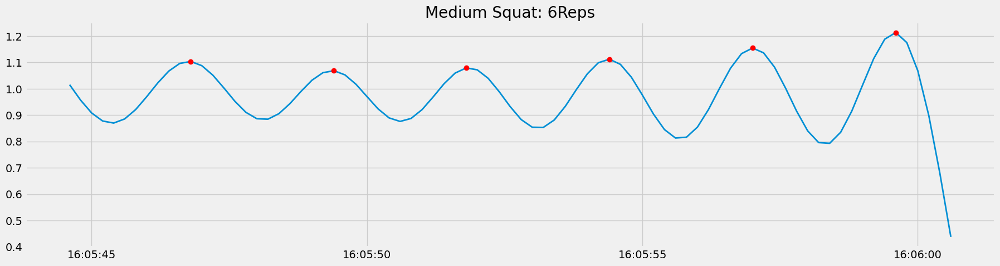

6

In [ ]:
count_reps(squat_set)

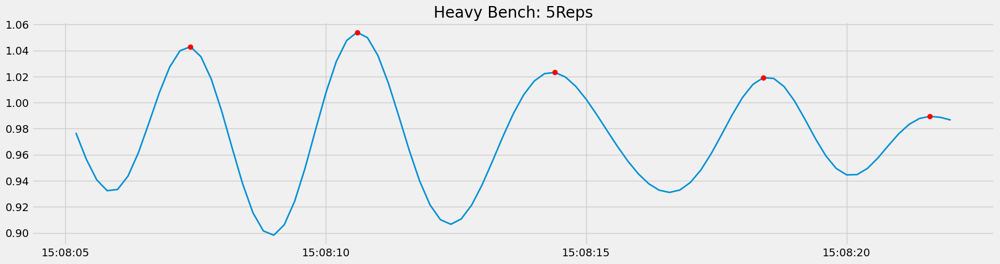

5

In [ ]:
def count_reps(dataset,cutoff=0.4,order=10,column="acc_r"):
    data = LowPass.low_pass_filter(
        dataset, col=column, sampling_frequency=fs, cutoff_frequency=0.4, order=order
    )
    indexers = argrelextrema(data[column + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexers]
    
    fif,ax = plt.subplots()
    plt.plot(dataset[f"{column}_lowpass"])
    plt.plot(peaks[f"{column}_lowpass"],"o",color="red")
    exercise = dataset["label"].iloc[0].title()
    category = dataset["category"].iloc[0].title()
    plt.title(f"{category} {exercise}: {len(peaks)}Reps")
    plt.show()
    
    return len (peaks)

count_reps(bench_set, cutoff=0.4)

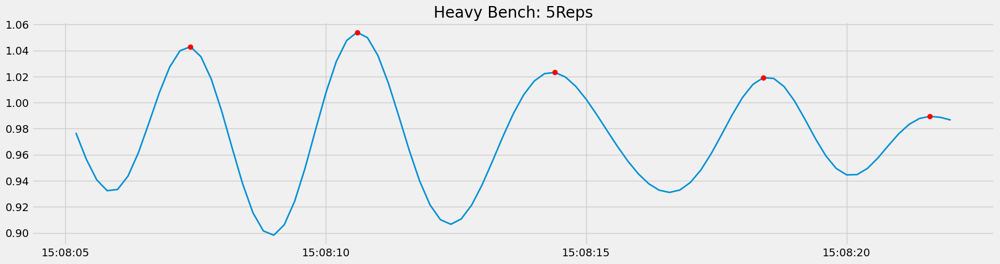

5

In [ ]:
count_reps(bench_set, cutoff=0.4)

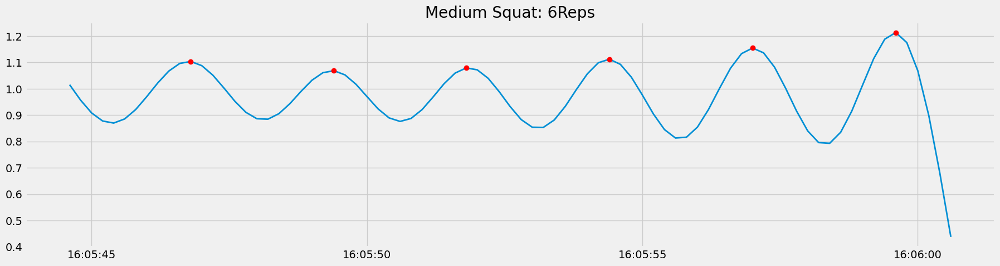

6

In [ ]:
count_reps(squat_set, cutoff=0.35)

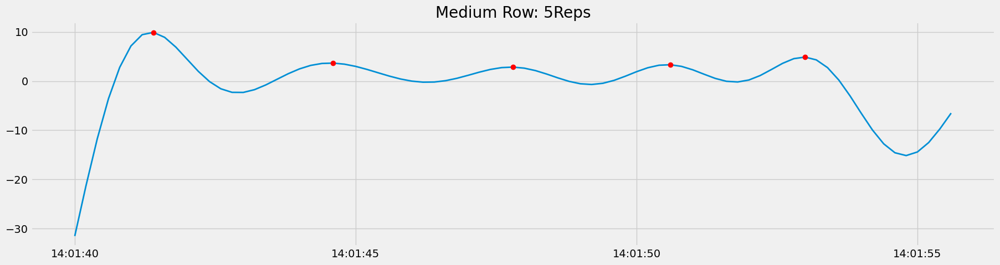

5

In [ ]:
count_reps(row_set, cutoff=0.6, column = "gyr_x")

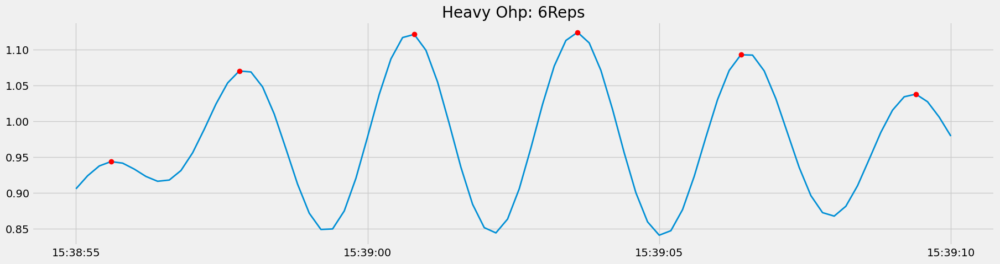

6

In [ ]:
count_reps(ohp_set, cutoff=0.35)

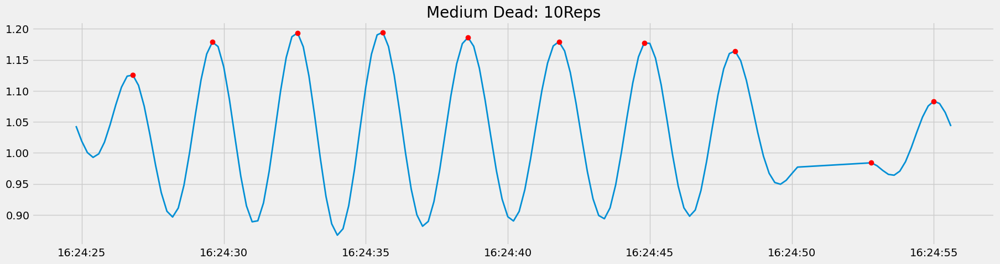

10

In [ ]:
count_reps(dead_set, cutoff=0.4)

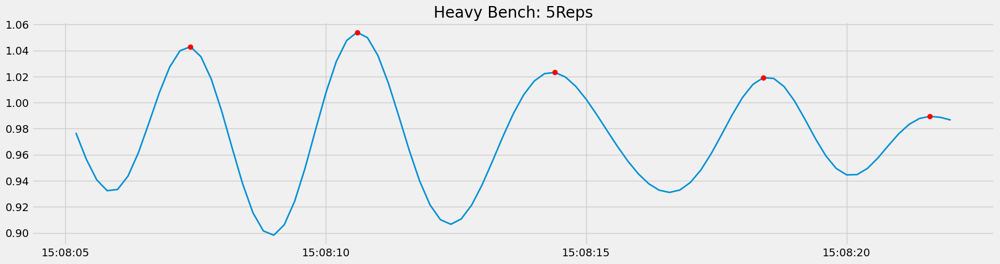

5

In [ ]:
count_reps(bench_set, cutoff=0.4)

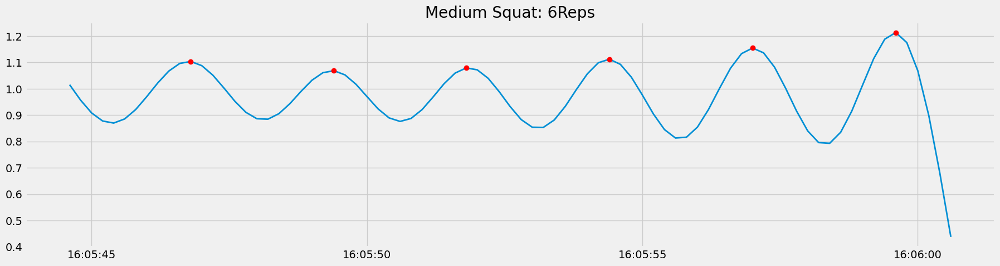

6

In [ ]:
count_reps(squat_set, cutoff=0.35)

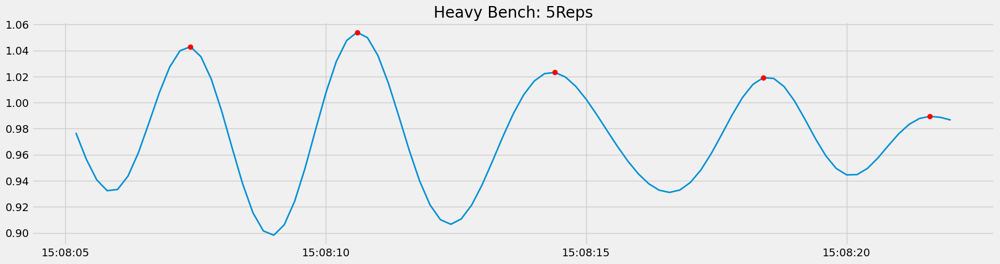

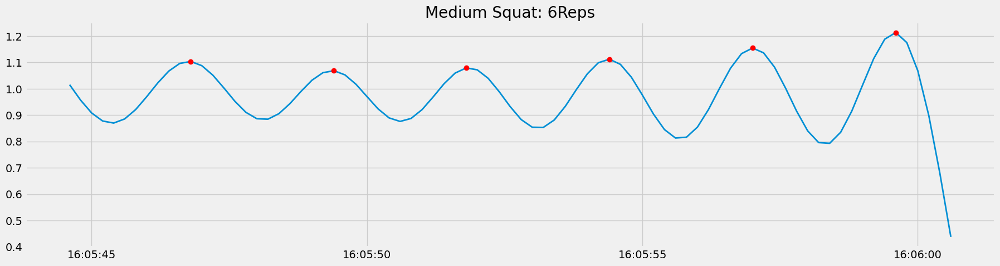

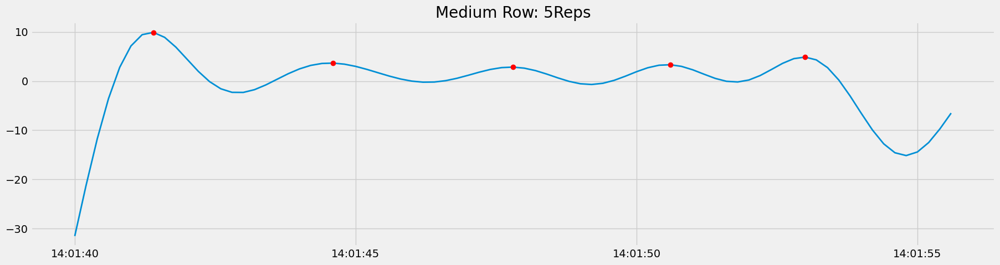

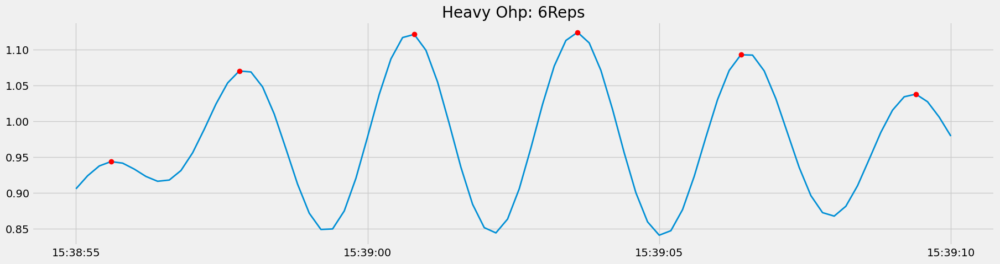

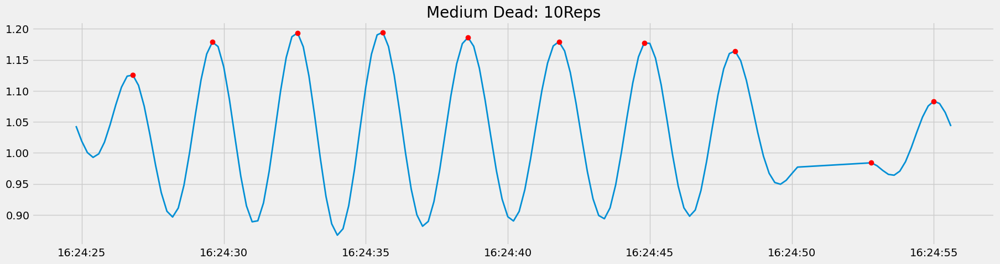

10

In [ ]:
count_reps(bench_set, cutoff=0.4)
count_reps(squat_set, cutoff=0.35)
count_reps(row_set, cutoff=0.6, column = "gyr_x")
count_reps(ohp_set, cutoff=0.35)
count_reps(dead_set, cutoff=0.4)

In [ ]:
df["reps"] = df["category"].apply(lambda x:5 if x == "heavy" else 10)

In [ ]:
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set,acc_r,gyr_r,reps
epoch (ms),,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30,0.979669,3.225625,5
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30,0.973752,2.887270,5
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30,0.973795,2.936720,5
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30,0.960118,9.473502,5
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30,0.964953,4.623585,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,90,1.045408,5.804424,10
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,90,1.032376,3.611408,10
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,90,1.035995,5.869377,10


In [ ]:
df.groupby(["label","category","set"])["reps"].max().reset_index()

,label,category,set,reps
0,bench,heavy,1,5
1,bench,heavy,2,5
2,bench,heavy,3,5
3,bench,heavy,4,5
4,bench,heavy,30,5
...,...,...,...,...
80,squat,medium,28,10
81,squat,medium,29,10
82,squat,medium,38,10
83,squat,medium,63,10


In [ ]:
rep_df = df.groupby(["label","category","set"])["reps"].max().reset_index()

In [ ]:
rep_df

,label,category,set,reps
0,bench,heavy,1,5
1,bench,heavy,2,5
2,bench,heavy,3,5
3,bench,heavy,4,5
4,bench,heavy,30,5
...,...,...,...,...
80,squat,medium,28,10
81,squat,medium,29,10
82,squat,medium,38,10
83,squat,medium,63,10


In [ ]:
rep_df["pres_pred"] = 0

In [ ]:
rep_df["pres_pred"] = 0

In [ ]:
rep_df

,label,category,set,reps,pres_pred
0,bench,heavy,1,5,0
1,bench,heavy,2,5,0
2,bench,heavy,3,5,0
3,bench,heavy,4,5,0
4,bench,heavy,30,5,0
...,...,...,...,...,...
80,squat,medium,28,10,0
81,squat,medium,29,10,0
82,squat,medium,38,10,0
83,squat,medium,63,10,0


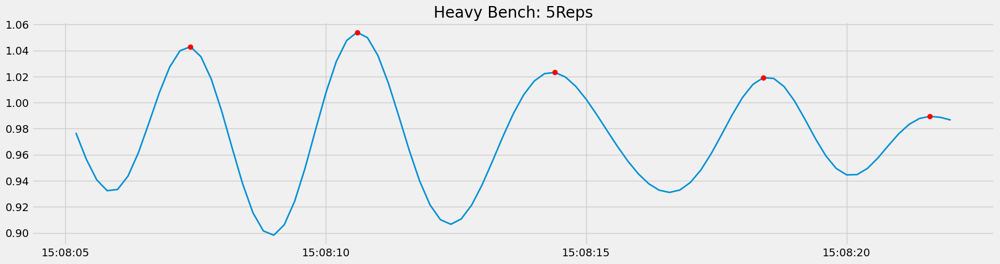

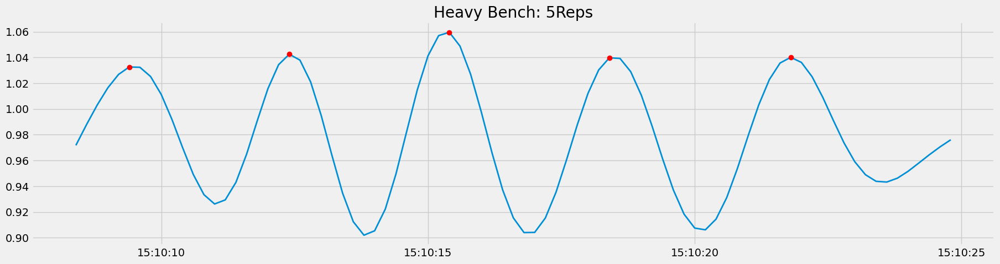

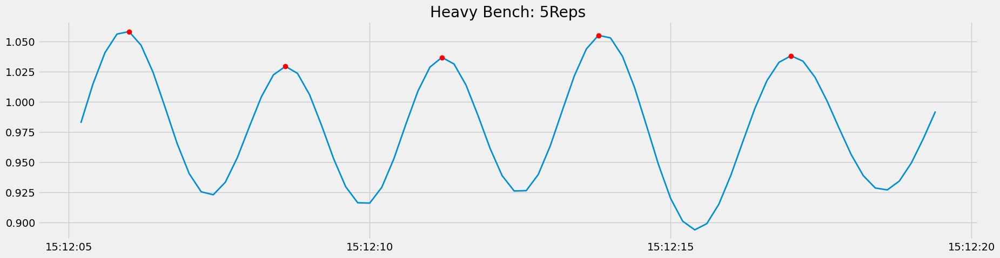

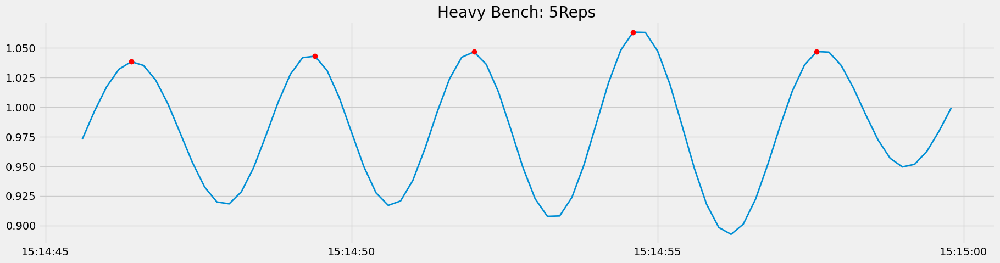

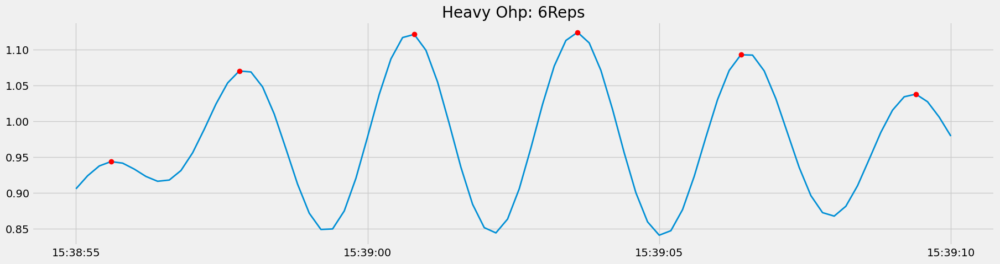

...

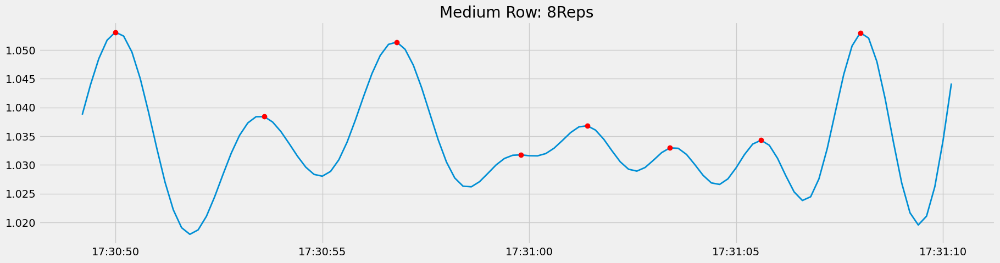

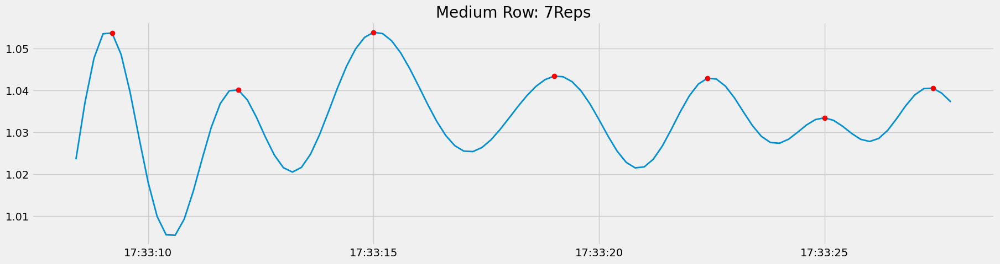

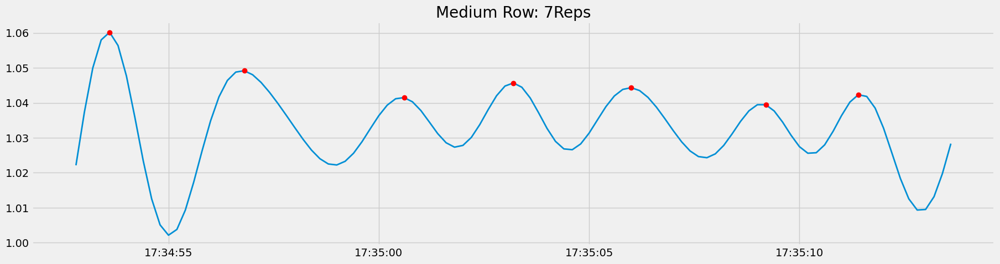

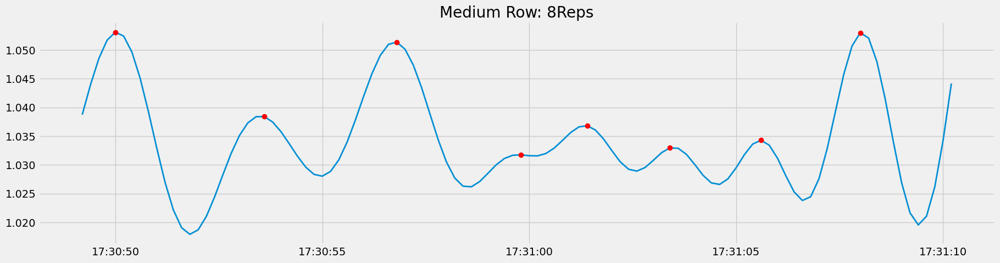

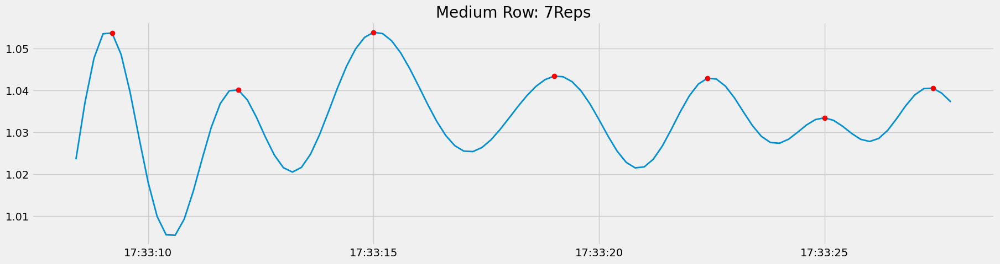

In [ ]:
for s in df["set"].unique():
    subset = df[df["set"] == s]
    
    column = "acc_r"
    cutoff = 0.4

    if subset["label"].iloc[0] == "squat":
        cutoff = 0.35
    
    if subset["label"].iloc[0] == "row":
        cutoff = 0.35
        col = "gyr_x"
        
    if subset["label"].iloc[0] == "ohp":
        cutoff = 0.35
        
    reps = count_reps(subset, cutoff=cutoff, column=column)
    
    rep_df.loc[rep_df["set"] == s,"reps_pred"] = reps
# -------------------------------------------------------

In [ ]:
rep_df

,label,category,set,reps,pres_pred,reps_pred
0,bench,heavy,1,5,0,5.0
1,bench,heavy,2,5,0,4.0
2,bench,heavy,3,5,0,5.0
3,bench,heavy,4,5,0,5.0
4,bench,heavy,30,5,0,5.0
...,...,...,...,...,...,...
80,squat,medium,28,10,0,10.0
81,squat,medium,29,10,0,10.0
82,squat,medium,38,10,0,7.0
83,squat,medium,63,10,0,11.0


In [ ]:
del rep_df["pres_pred"]

In [ ]:
rep_df

,label,category,set,reps,reps_pred
0,bench,heavy,1,5,5.0
1,bench,heavy,2,5,4.0
2,bench,heavy,3,5,5.0
3,bench,heavy,4,5,5.0
4,bench,heavy,30,5,5.0
...,...,...,...,...,...
80,squat,medium,28,10,10.0
81,squat,medium,29,10,10.0
82,squat,medium,38,10,7.0
83,squat,medium,63,10,11.0


In [ ]:
error = round(mean_absolute_error(rep_df["reps"], rep_df["reps_pred"]), 2)

In [ ]:
error

1.16

<Axes: xlabel='label,category'>

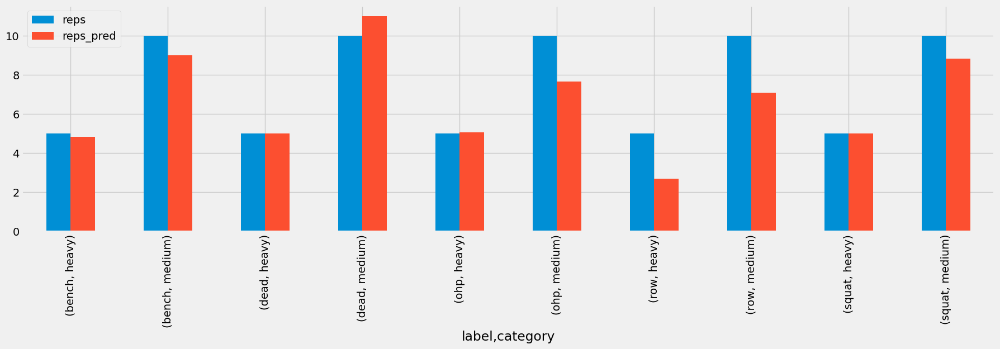

In [ ]:
rep_df.groupby(["label", "category"])[["reps", "reps_pred"]].mean().plot.bar()